<a href="https://colab.research.google.com/github/PacktPublishing/Hands-On-Computer-Vision-with-PyTorch/blob/master/Chapter10/Multi_object_segmentation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install -qU openimages torch_snippets

     |████████████████████████████████| 133kB 18.4MB/s 
     |████████████████████████████████| 51kB 8.1MB/s 
     |████████████████████████████████| 36.7MB 84kB/s 
     |████████████████████████████████| 61kB 10.0MB/s 
     |████████████████████████████████| 71kB 11.7MB/s 
     |████████████████████████████████| 6.7MB 55.9MB/s 
     |████████████████████████████████| 296kB 53.1MB/s 
     |████████████████████████████████| 137.3MB 29kB/s 
     |████████████████████████████████| 102kB 13.5MB/s 
ERROR: botocore 1.19.13 has requirement urllib3<1.26,>=1.25.4; python_version != "3.4", but you'll have urllib3 1.24.3 which is incompatible.


In [ ]:
from torch_snippets import *
!wget -O train-annotations-object-segmentation.csv -q https://storage.googleapis.com/openimages/v5/train-annotations-object-segmentation.csv
!wget -O classes.csv -q https://raw.githubusercontent.com/openimages/dataset/master/dict.csv 

In [ ]:
from torch_snippets import *

In [ ]:
required_classes = 'person,dog,bird,car,elephant,football,jug,laptop,Mushroom,Pizza,Rocket,Shirt,Traffic sign,Watermelon,Zebra'
required_classes = [c.lower() for c in required_classes.lower().split(',')]

classes = pd.read_csv('classes.csv', header=None)
classes.columns = ['class','class_name']
classes = classes[classes['class_name'].map(lambda x: x in required_classes)]

In [ ]:
from torch_snippets import *
df = pd.read_csv('train-annotations-object-segmentation.csv')
df.head()

data = pd.merge(df, classes, left_on='LabelName', right_on='class')

subset_data = data.groupby('class_name').agg({'ImageID': lambda x: list(x)[:500]})
subset_data = flatten(subset_data.ImageID.tolist())
subset_data = data[data['ImageID'].map(lambda x: x in subset_data)]
subset_masks = subset_data['MaskPath'].tolist()

In [ ]:
!mkdir -p masks
for c in Tqdm('0123456789abcdef'):
    !wget -q https://storage.googleapis.com/openimages/v5/train-masks/train-masks-{c}.zip
    !unzip -q train-masks-{c}.zip -d tmp_masks
    !rm train-masks-{c}.zip
    tmp_masks = Glob('tmp_masks', silent=True)
    items = [(m,fname(m)) for m in tmp_masks]
    items = [(i,j) for (i,j) in items if j in subset_masks]
    for i,j in items:
        os.rename(i, f'masks/{j}')
    !rm -rf tmp_masks

100%|██████████| 16/16 [22:08<00:00, 83.00s/it]


In [ ]:
masks = Glob('masks')
masks = [fname(mask) for mask in masks]

subset_data = subset_data[subset_data['MaskPath'].map(lambda x: x in masks)]
subset_imageIds = subset_data['ImageID'].tolist()

from openimages.download import _download_images_by_id
!mkdir images
_download_images_by_id(subset_imageIds, 'train', './images/')

2020-11-08 07:56:18.896 | INFO     | torch_snippets.loader:Glob:181 - 14090 files found at masks
100%|██████████| 14090/14090 [13:14<00:00, 17.73it/s]


In [ ]:
import zipfile
files = Glob('images') + Glob('masks') + ['train-annotations-object-segmentation.csv', 'classes.csv']
with zipfile.ZipFile('data.zip','w') as zipme:
    for file in Tqdm(files):
        zipme.write(file, compress_type=zipfile.ZIP_DEFLATED)

2020-11-08 08:09:35.995 | INFO     | torch_snippets.loader:Glob:181 - 5913 files found at images
2020-11-08 08:09:36.027 | INFO     | torch_snippets.loader:Glob:181 - 14090 files found at masks
100%|██████████| 20005/20005 [02:26<00:00, 136.17it/s]


In [ ]:
!mkdir -p train/
!mv images train/myData2020
!mv masks train/annotations

In [ ]:
!pip install git+git://github.com/waspinator/pycococreator.git@0.2.0
import datetime

INFO = {
    "description": "MyData2020",
    "url": "None",
    "version": "1.0",
    "year": 2020,
    "contributor": "sizhky",
    "date_created": datetime.datetime.utcnow().isoformat(' ')
}

LICENSES = [
    {
        "id": 1,
        "name": "MIT"
    }
]

CATEGORIES = [{'id': id+1, 'name': name.replace('/',''), 'supercategory': 'none'} for id,(_,(name, clss_name)) in enumerate(classes.iterrows())]

  Cloning git://github.com/waspinator/pycococreator.git (to revision 0.2.0) to /tmp/pip-req-build-pcdnflw0
  Running command git clone -q git://github.com/waspinator/pycococreator.git /tmp/pip-req-build-pcdnflw0
  Running command git checkout -q fba8f4098f3c7aaa05fe119dc93bbe4063afdab8
  Created wheel for pycococreatortools: filename=pycococreatortools-0.2.0-cp36-none-any.whl size=7191 sha256=6bd3c59ddc5450d6023aa31e4b7166da0bb672e054c8fb11c71e37ef411e2436
  Stored in directory: /tmp/pip-ephem-wheel-cache-pel6k71x/wheels/ad/8a/49/9cda5b77c0aec14230df33a9ddfaf60bf488f08a311a2aec0f
Successfully built pycococreatortools


In [ ]:
!pip install pycocotools
from pycococreatortools import pycococreatortools
from os import listdir
from os.path import isfile, join
from PIL import Image

coco_output = {
    "info": INFO,
    "licenses": LICENSES,
    "categories": CATEGORIES,
    "images": [],
    "annotations": []
}

In [ ]:
ROOT_DIR = "train"
IMAGE_DIR, ANNOTATION_DIR = 'train/myData2020/', 'train/annotations/'
image_files = [f for f in listdir(IMAGE_DIR) if isfile(join(IMAGE_DIR, f))]
annotation_files = [f for f in listdir(ANNOTATION_DIR) if isfile(join(ANNOTATION_DIR, f))]

In [ ]:
image_id = 1
# go through each image
for image_filename in Tqdm(image_files):
    image = Image.open(IMAGE_DIR + '/' + image_filename)
    image_info = pycococreatortools.create_image_info(image_id, os.path.basename(image_filename), image.size)
    coco_output["images"].append(image_info)
    image_id = image_id + 1

100%|██████████| 5913/5913 [00:01<00:00, 3004.36it/s]


In [ ]:
segmentation_id = 1
for annotation_filename in Tqdm(annotation_files):
    image_id = [f for f in coco_output['images'] if stem(f['file_name'])==annotation_filename.split('_')[0]][0]['id']
    class_id = [x['id'] for x in CATEGORIES if x['name'] in annotation_filename][0]
    category_info = {'id': class_id, 'is_crowd': 'crowd' in image_filename}
    binary_mask = np.asarray(Image.open(f'{ANNOTATION_DIR}/{annotation_filename}').convert('1')).astype(np.uint8)
 
    annotation_info = pycococreatortools.create_annotation_info(segmentation_id, image_id, category_info, binary_mask, image.size, tolerance=2)

    if annotation_info is not None:
        coco_output["annotations"].append(annotation_info)
        segmentation_id = segmentation_id + 1

100%|██████████| 14090/14090 [10:08<00:00, 23.14it/s]


In [ ]:
coco_output['categories'] = [{'id': id+1, 'name': clss_name, 'supercategory': 'none'} for id,(_,(name, clss_name)) in enumerate(classes.iterrows())]

import json
with open('images.json', 'w') as output_json_file:
    json.dump(coco_output, output_json_file)

In [ ]:
!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.7/index.html
!pip install pyyaml==5.1 pycocotools>=2.0.1

Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.7/index.html
     |████████████████████████████████| 6.8MB 328kB/s 
     |████████████████████████████████| 2.2MB 12.7MB/s 
     |████████████████████████████████| 276kB 52.3MB/s 
  Created wheel for fvcore: filename=fvcore-0.1.2.post20201104-cp36-none-any.whl size=44419 sha256=86478e8302678ddd903f0ac37a0e09254ef706acb4257273d77e85d0af90b9a9
  Stored in directory: /root/.cache/pip/wheels/ec/4d/40/4077356fe02ef345791713eabede5ed63afe7d613b016694d1
  Created wheel for pyyaml: filename=PyYAML-5.3.1-cp36-cp36m-linux_x86_64.whl size=44619 sha256=60165938666b6b4dcea7bf077cf092e0188a1dfced899c0294d8d9839f19361c
  Stored in directory: /root/.cache/pip/wheels/a7/c1/ea/cf5bd31012e735dc1dfea3131a2d5eae7978b251083d6247bd
Successfully built fvcore pyyaml
ERROR: albumentations 0.1.12 has requirement imgaug<0.2.7,>=0.2.5, but you'll have imgaug 0.2.9 which is incompatible.
  Found existing installation: Pillow 7.0.0
    U

In [ ]:
from torch_snippets import *
required_classes = 'person,dog,bird,car,elephant,football,jug,laptop,Mushroom,Pizza,Rocket,Shirt,Traffic sign,Watermelon,Zebra'
required_classes = [c.lower() for c in required_classes.lower().split(',')]

classes = pd.read_csv('classes.csv', header=None)
classes.columns = ['class','class_name']
classes = classes[classes['class_name'].map(lambda x: x in required_classes)]

In [ ]:
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog
from detectron2.engine import DefaultTrainer

In [ ]:
from detectron2.data.datasets import register_coco_instances
register_coco_instances("dataset_train", {}, "images.json", "train/myData2020")

In [ ]:
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("dataset_train",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml") # pretrained weights
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.00025 # pick a good LR
cfg.SOLVER.MAX_ITER = 5000 # instead of epochs, we train on 5000 batches
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 512
cfg.MODEL.ROI_HEADS.NUM_CLASSES = len(classes) 

In [ ]:
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

[11/08 08:24:21 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_f10217.pkl: 178MB [00:12, 14.7MB/s]                           
Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (16, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (16,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (60, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (60,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.mask_head.predictor.weight' to the model due 

[11/08 08:24:40 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.6/dist-packages/detectron2/structures/masks.py:345: UserWarning: This overload of nonzero is deprecated:
	nonzero()
Consider using one of the following signatures instead:
	nonzero(*, bool as_tuple) (Triggered internally at  /pytorch/torch/csrc/utils/python_arg_parser.cpp:882.)
  item = item.nonzero().squeeze(1).cpu().numpy().tolist()
/usr/local/lib/python3.6/dist-packages/detectron2/structures/masks.py:345: UserWarning: This overload of nonzero is deprecated:
	nonzero()
Consider using one of the following signatures instead:
	nonzero(*, bool as_tuple) (Triggered internally at  /pytorch/torch/csrc/utils/python_arg_parser.cpp:882.)
  item = item.nonzero().squeeze(1).cpu().numpy().tolist()
/usr/local/lib/python3.6/dist-packages/detectron2/modeling/roi_heads/fast_rcnn.py:217: UserWarning: This overload of nonzero is deprecated:
	nonzero()
Consider using one of the following signatures instead:
	nonzero(*, bool as_tuple) (Triggered internally at  /pytorch/torch/csrc/

[11/08 08:24:54 d2.utils.events]:  eta: 0:56:03  iter: 19  total_loss: 3.918  loss_cls: 3.007  loss_box_reg: 0.1019  loss_mask: 0.6933  loss_rpn_cls: 0.08869  loss_rpn_loc: 0.01341  time: 0.6693  data_time: 0.0213  lr: 4.9953e-06  max_mem: 2765M
[11/08 08:25:07 d2.utils.events]:  eta: 0:55:17  iter: 39  total_loss: 3.816  loss_cls: 2.833  loss_box_reg: 0.1115  loss_mask: 0.6932  loss_rpn_cls: 0.1063  loss_rpn_loc: 0.02339  time: 0.6631  data_time: 0.0065  lr: 9.9902e-06  max_mem: 2765M
[11/08 08:25:20 d2.utils.events]:  eta: 0:53:36  iter: 59  total_loss: 3.476  loss_cls: 2.542  loss_box_reg: 0.121  loss_mask: 0.6908  loss_rpn_cls: 0.02105  loss_rpn_loc: 0.009078  time: 0.6574  data_time: 0.0060  lr: 1.4985e-05  max_mem: 2765M
[11/08 08:25:33 d2.utils.events]:  eta: 0:54:24  iter: 79  total_loss: 3.112  loss_cls: 2.149  loss_box_reg: 0.08687  loss_mask: 0.6904  loss_rpn_cls: 0.09889  loss_rpn_loc: 0.0203  time: 0.6604  data_time: 0.0055  lr: 1.998e-05  max_mem: 2765M
[11/08 08:25:46 d2

In [ ]:
!cp output/model_final.pth output/trained_model.pth

2020-11-08 09:23:09.778 | INFO     | torch_snippets.loader:Glob:181 - 5913 files found at train/myData2020


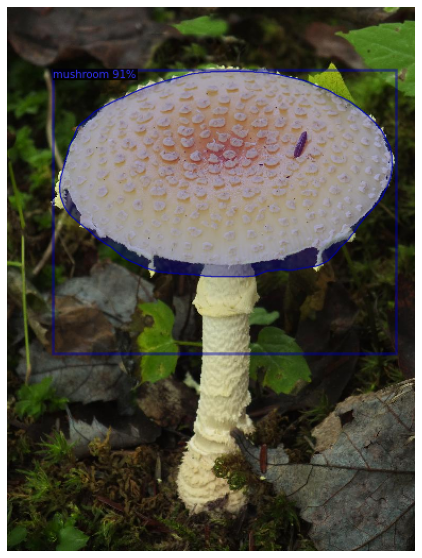

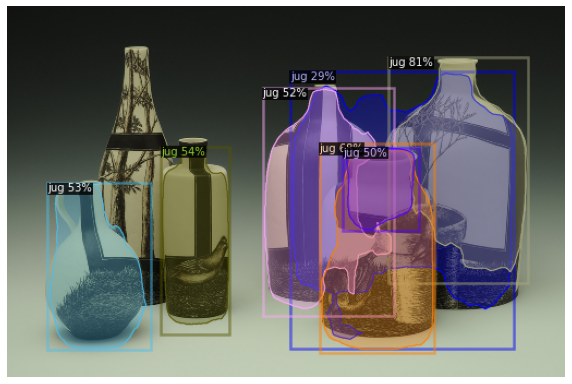

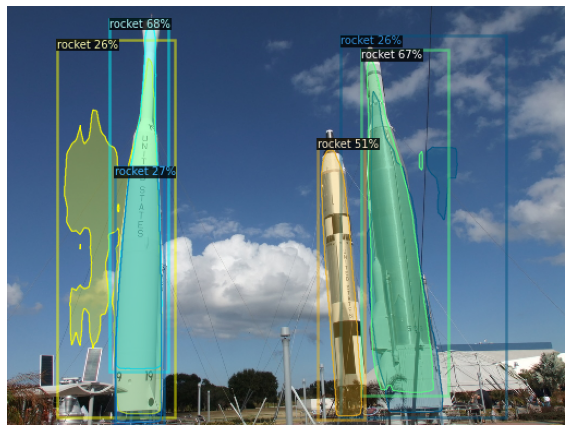

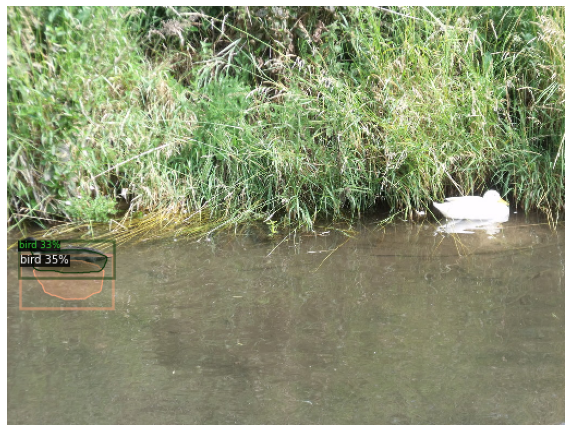

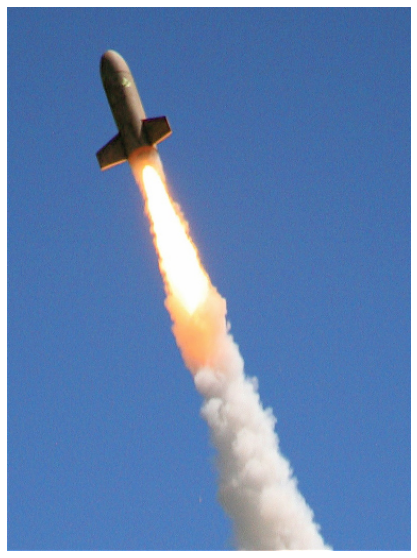

...

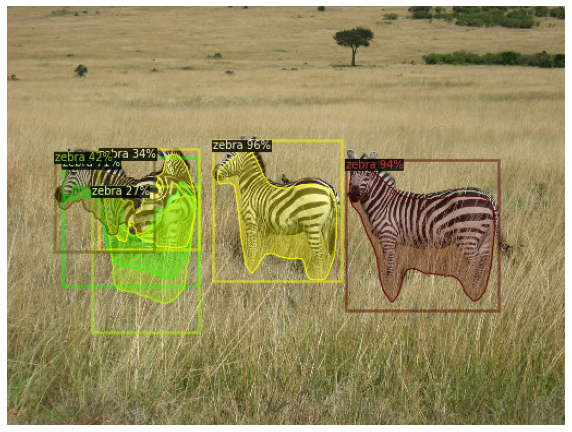

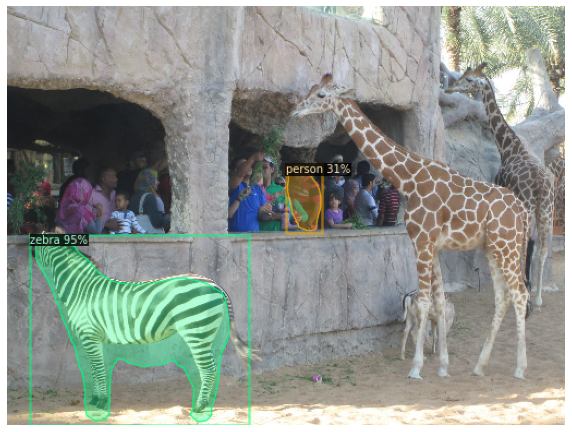

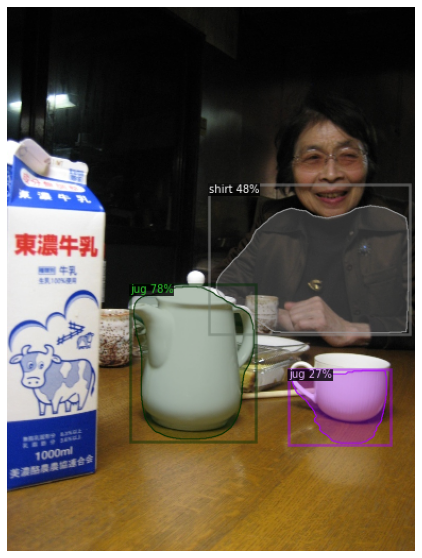

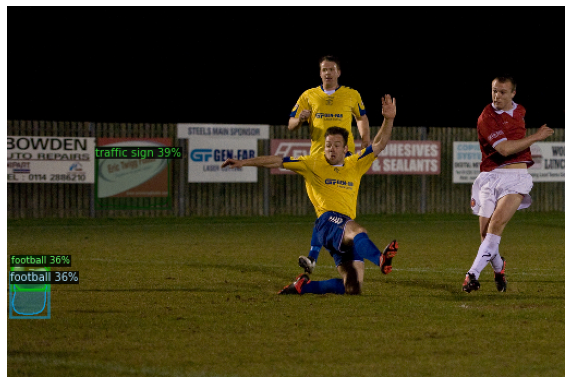

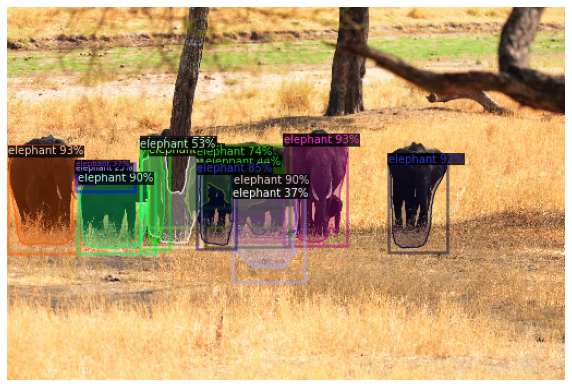

In [ ]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "trained_model.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.25
predictor = DefaultPredictor(cfg)
from detectron2.utils.visualizer import ColorMode
files = Glob('train/myData2020')
for _ in range(30):
    im = cv2.imread(choose(files))
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1],
                    scale=0.5,
                    metadata=MetadataCatalog.get("dataset_train"),
                    instance_mode=ColorMode.IMAGE_BW 
# remove the colors of unsegmented pixels. 
# This option is only available for segmentation models
    )

    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    show(out.get_image())